In [2]:
import sqlite3

cnx = sqlite3.connect("test.db")
cursor = cnx.cursor()



# 1179. Reformat Department Table
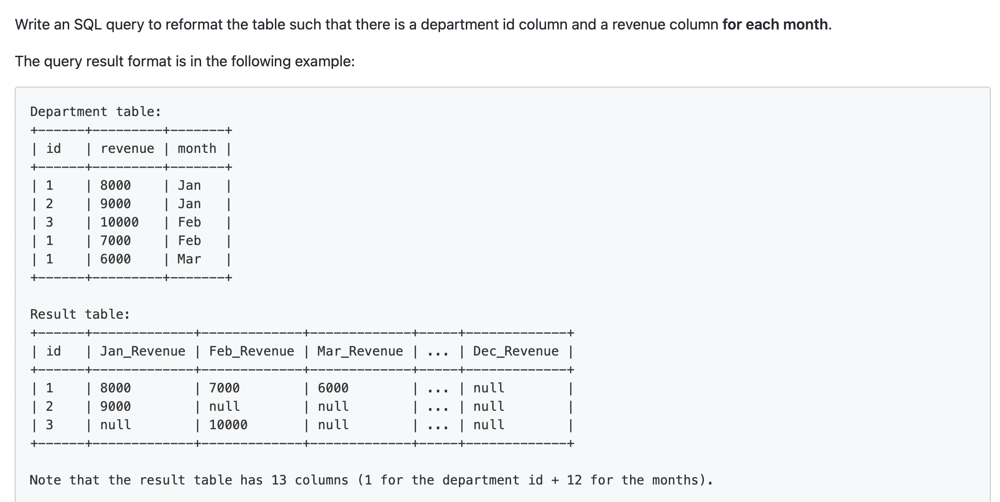

In [3]:
query = '''SELECT id, 
Sum(IIF(month = 'Jan', revenue, NULL)) as Jan_Revenue,
Sum(IIF(month = 'Feb', revenue, NULL)) as Feb_Revenue,
Sum(IIF(month = 'Mar', revenue, NULL)) as Mar_Revenue,
Sum(IIF(month = 'Apr', revenue, NULL)) as Apr_Revenue,
Sum(IIF(month = 'May', revenue, NULL)) as May_Revenue,
Sum(IIF(month = 'Jun', revenue, NULL)) as Jun_Revenue,
Sum(IIF(month = 'Jul', revenue, NULL)) as Jul_Revenue,
Sum(IIF(month = 'Aug', revenue, NULL)) as Aug_Revenue,
Sum(IIF(month = 'Sep', revenue, NULL)) as Sep_Revenue,
Sum(IIF(month = 'Oct', revenue, NULL)) as Oct_Revenue,
Sum(IIF(month = 'Nov', revenue, NULL)) as Nov_Revenue,
Sum(IIF(month = 'Dec', revenue, NULL)) as Dec_Revenue
FROM Department2
GROUP BY id'''
cursor.execute(query)
for row in cursor:
    print(row) 

(1, 8000, 7000, 6000, None, None, None, None, None, None, None, None, None)
(2, 9000, None, None, None, None, None, None, None, None, None, None, None)
(3, None, 10000, None, None, None, None, None, None, None, None, None, None)


# 1270. All People Report to the Given Manager

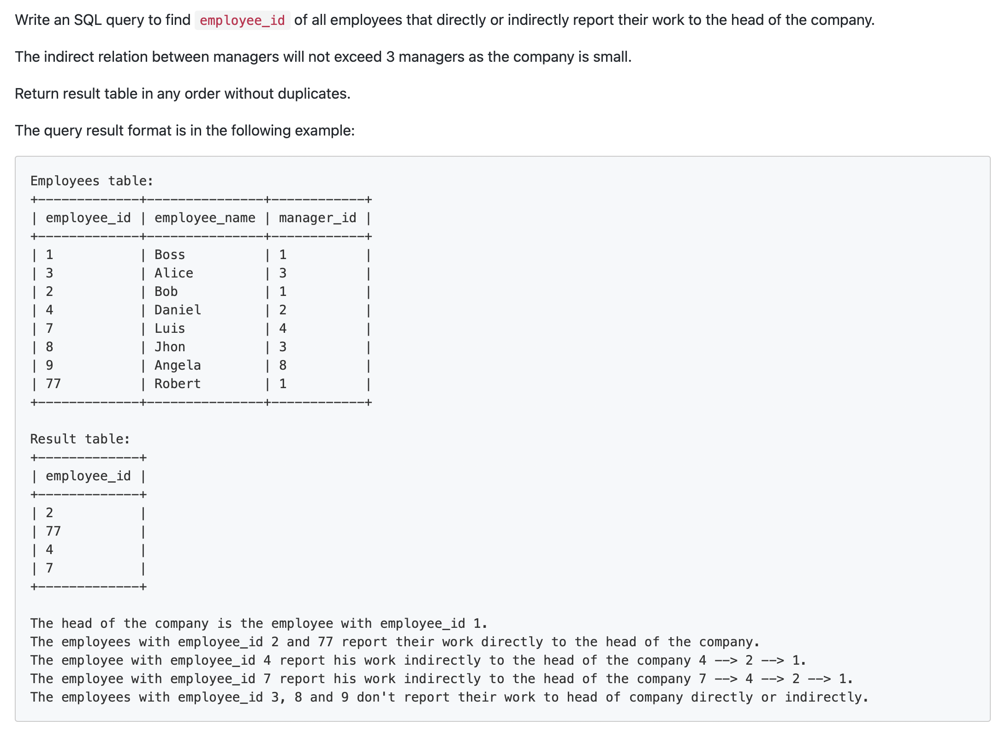

In [4]:
query = '''SELECT a.employee_id FROM Employees a JOIN Employees b JOIN Employees c
ON a.manager_id=b.employee_id AND b.manager_id = c.employee_id
WHERE c.manager_id=1 AND a.employee_id !=1
'''
cursor.execute(query)
for row in cursor:
    print(row) 

(2,)
(77,)
(4,)
(7,)


# 1355. Activity Participants
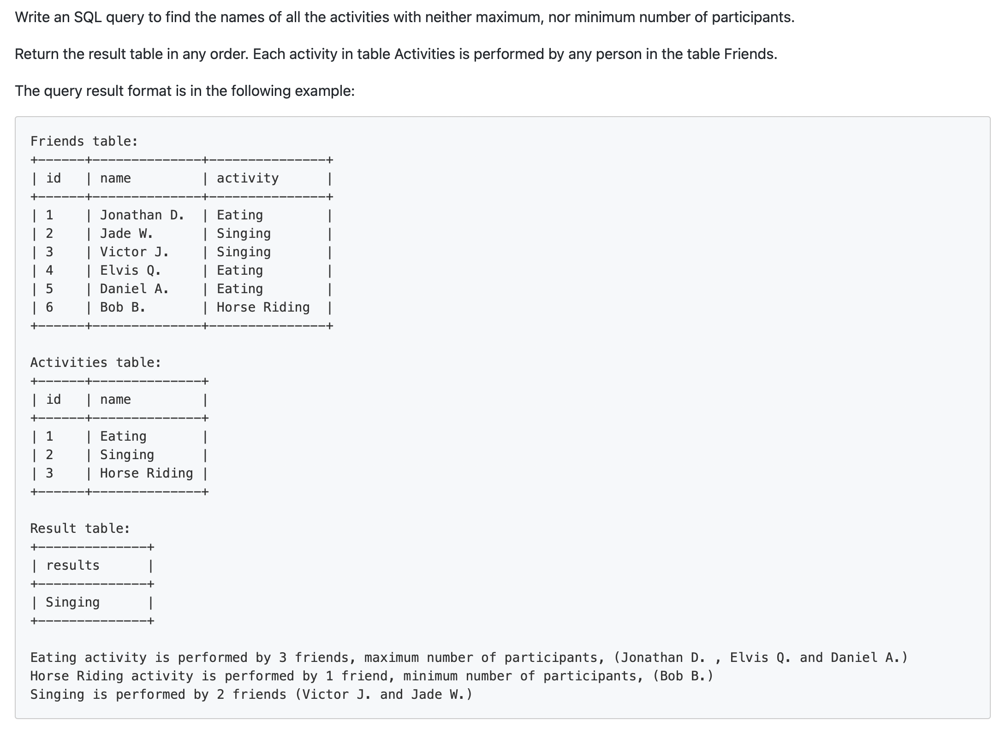

In [5]:
query = '''SELECT activity FROM Friends GROUP BY activity
HAVING count(*) != (SELECT count(*) FROM Friends GROUP BY activity ORDER BY count(*) ASC LIMIT 1)
AND count(*) != (SELECT count(*) FROM Friends GROUP BY activity ORDER BY count(*) DESC LIMIT 1)
'''
cursor.execute(query)
for row in cursor:
    print(row) 

('Singing',)


# 1479. Sales by Day of the Week
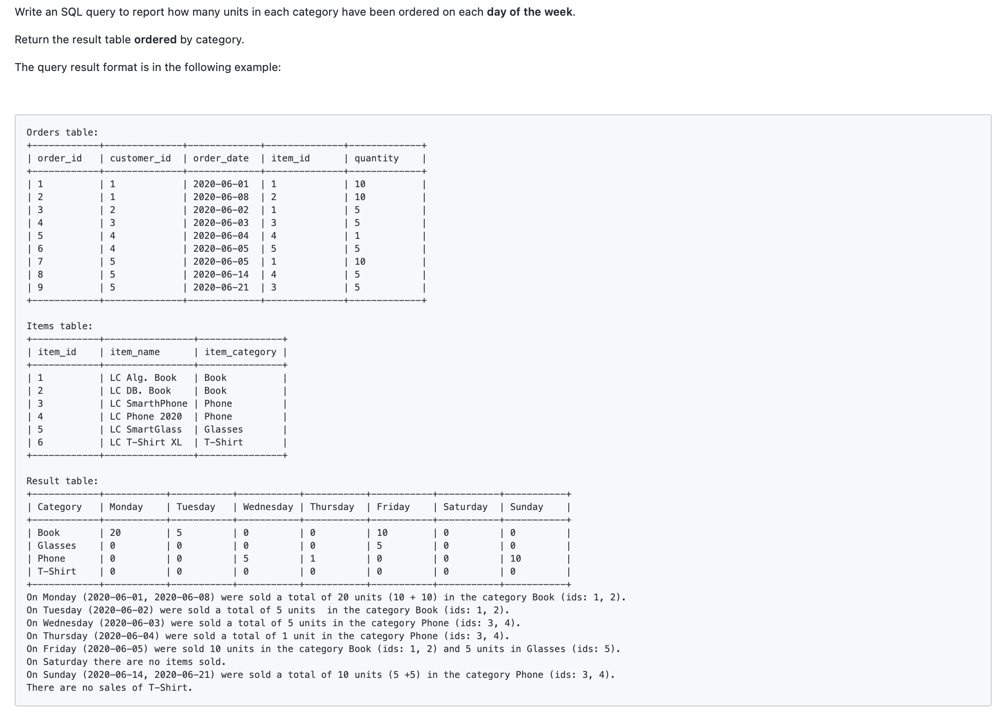

In [7]:
query = '''select item_category as category,
    sum(IIF(strftime('%w', order_date)=1,quantity,0)) as Monday,
    sum(IIF(strftime('%w', order_date)=2,quantity,0)) as Tuesday,
    sum(IIF(strftime('%w', order_date)=3,quantity,0)) as Wednesday,
    sum(IIF(strftime('%w', order_date)=4,quantity,0)) as Thursday,
    sum(IIF(strftime('%w', order_date)=5,quantity,0)) as Friday,
    sum(IIF(strftime('%w', order_date)=6,quantity,0)) as Saturday,
    sum(IIF(strftime('%w', order_date)=0,quantity,0)) as Sunday
    from Items i left join Orders2 o on i.item_id = o.item_id
    group by item_category
    order by item_category'''
cursor.execute(query)
for row in cursor:
    print(row)

('Book', 0, 0, 0, 0, 0, 0, 0)
('Glasses', 0, 0, 0, 0, 0, 0, 0)
('Phone', 0, 0, 0, 0, 0, 0, 0)
('T-Shirt', 0, 0, 0, 0, 0, 0, 0)


# 1369. Get the Second Most Recent Activity
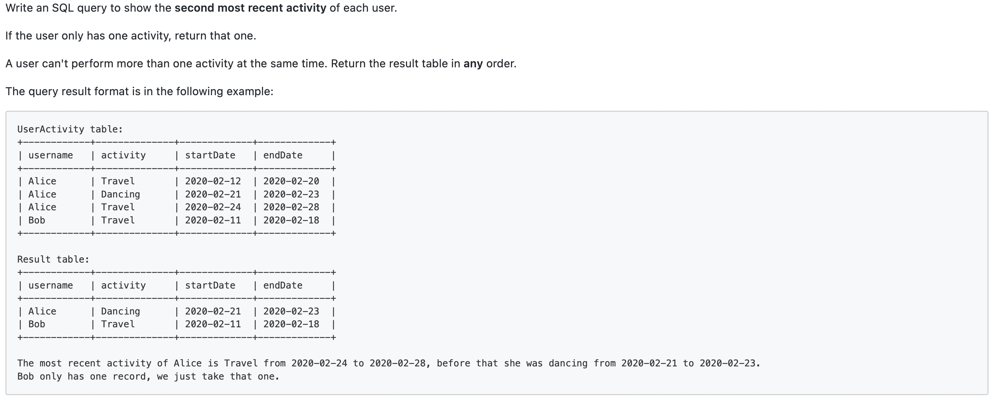

In [9]:
query = '''SELECT username, activity, startDate, endDate FROM 
(SELECT *, 
rank() over (partition by username order by startDate DESC) r,
count() over (partition by username) c
FROM UserActivity)
WHERE r=2 or c =1
'''
cursor.execute(query)
for row in cursor:
    print(row)

('Alice', 'Dancing', '2020-02-21', '2020-02-23')
('Bob', 'Travel', '2020-02-11', '2020-02-18')


# 1454. Active Users
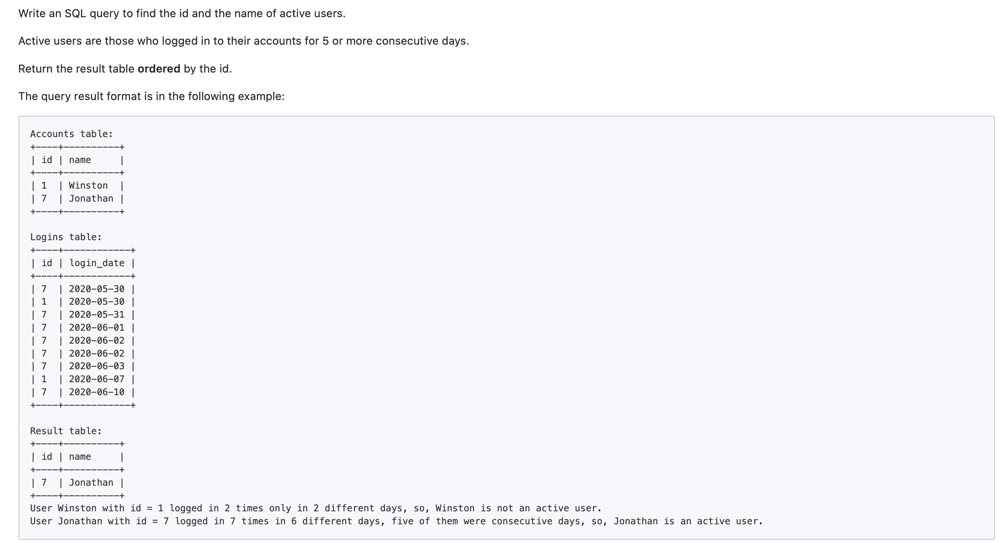
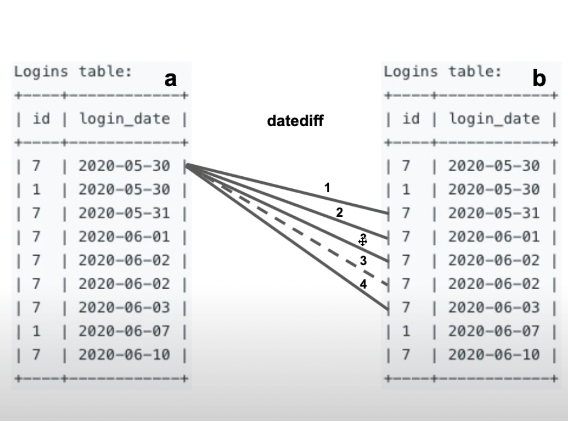

In [15]:

cursor.execute("CREATE TABLE IF NOT EXISTS Accounts (id int, name text)") 
cursor.execute("INSERT INTO Accounts (id, name) VALUES (1,'Winston'),(7,'Jonathan')")
cnx.commit()

In [ ]:
cursor.execute("CREATE TABLE IF NOT EXISTS Logins (id int, login_date text)") 
cursor.execute("INSERT INTO Logins (id, login_date) VALUES (7,'2020-05-30'),(1,'2020-05-30'),(7,'2020-05-31'),(7,'2020-06-01'),(7,'2020-06-02'),(7,'2020-06-02'),(7,'2020-06-03'),(1,'2020-06-07'),(7,'2020-06-10')")
cnx.commit()

In [18]:
query = '''SELECT l1.id, a.name FROM Logins l1 JOIN Logins l2 on l1.id = l2.id
AND (JULIANDAY(l1.login_date) - JULIANDAY(l2.login_date)) between 1 and 4 
JOIN Accounts a ON l1.id=a.id
GROUP BY l1.id
HAVING COUNT(DISTINCT l2.login_date)=4'''
cursor.execute(query)
for row in cursor:
    print(row)

(7, 'Jonathan')


In [10]:
query = '''
SELECT t1.id, name FROM 
(SELECT *, DENSE_RANK() OVER (PARTITION BY id ORDER BY login_date) as rnk FROM Logins) t1
JOIN (SELECT *, DENSE_RANK() OVER (PARTITION BY id ORDER BY login_date) as rnk FROM Logins) t2
ON t1.rnk + 4 = t2.rnk AND t1.id = t2.id
JOIN Accounts a ON a.id = t1.id
WHERE JULIANDAY(t2.login_date) - JULIANDAY(t1.login_date) = 4
'''
cursor.execute(query)
for row in cursor:
    print(row)

(7, 'Jonathan')


 # 1596. The Most Frequently Ordered Products for Each Customer
 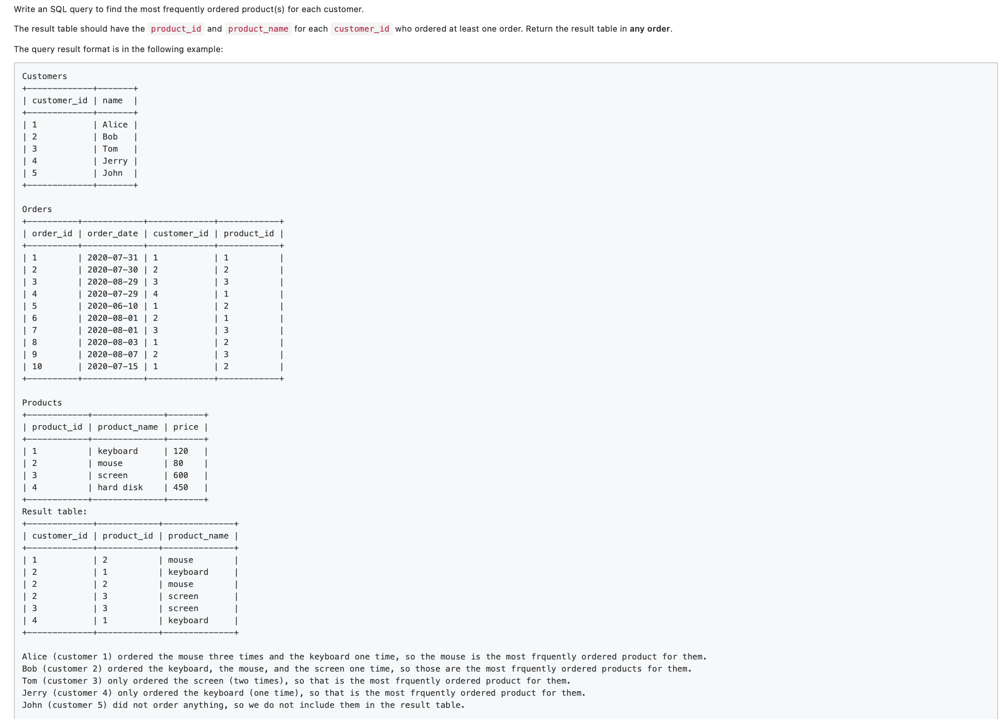

In [11]:
query = '''SELECT customer_id, product_id, product_name FROM 
(SELECT *,
DENSE_RANK() OVER (PARTITION BY customer_id ORDER BY count DESC) rnk FROM
(SELECT *, count(1) count FROM Orders3 o LEFT JOIN Products2 p
ON o.product_id = p.product_id GROUP BY customer_id, product_name))
WHERE rnk = 1'''
cursor.execute(query)
for row in cursor:
    print(row)

(1, 2, 'mouse')
(2, 1, 'keyboard')
(2, 2, 'mouse')
(2, 3, 'screen')
(3, 3, 'screen')
(4, 1, 'keyboard')


# 1777. Product's Price for Each Store
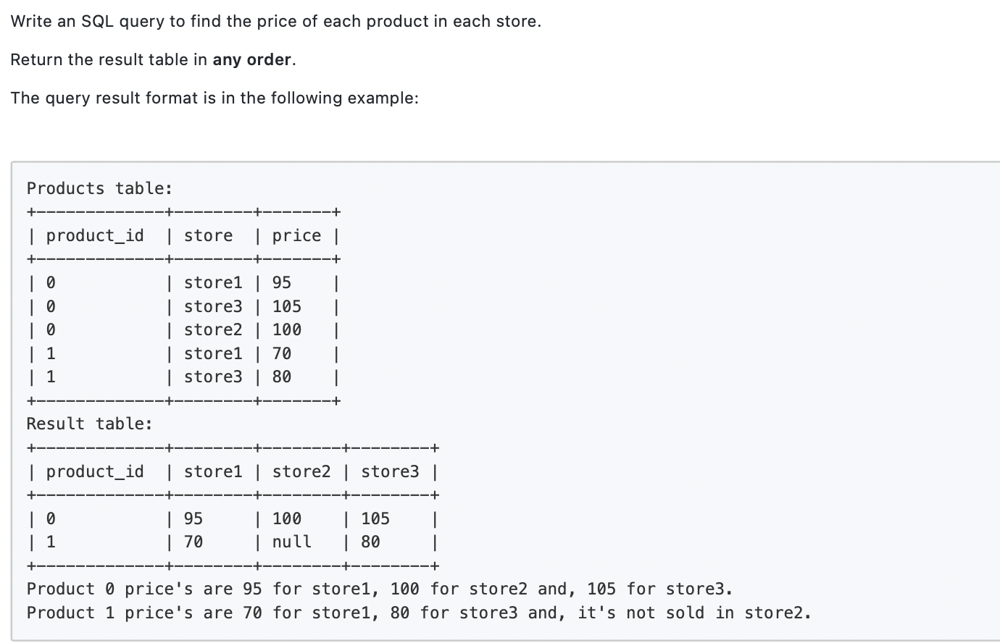

In [12]:
query = '''SELECT product_id, MAX(IIF(store='store1', price, null)) as store1,
MAX(IIF(store='store2', price, null)) as store2,
MAX(IIF(store='store3', price, null)) as store3
FROM Products3 GROUP BY product_id'''
cursor.execute(query)
for row in cursor:
    print(row)

(0, 95, 100, 105)
(1, 70, None, 80)


# 1715. Count Apples and Oranges
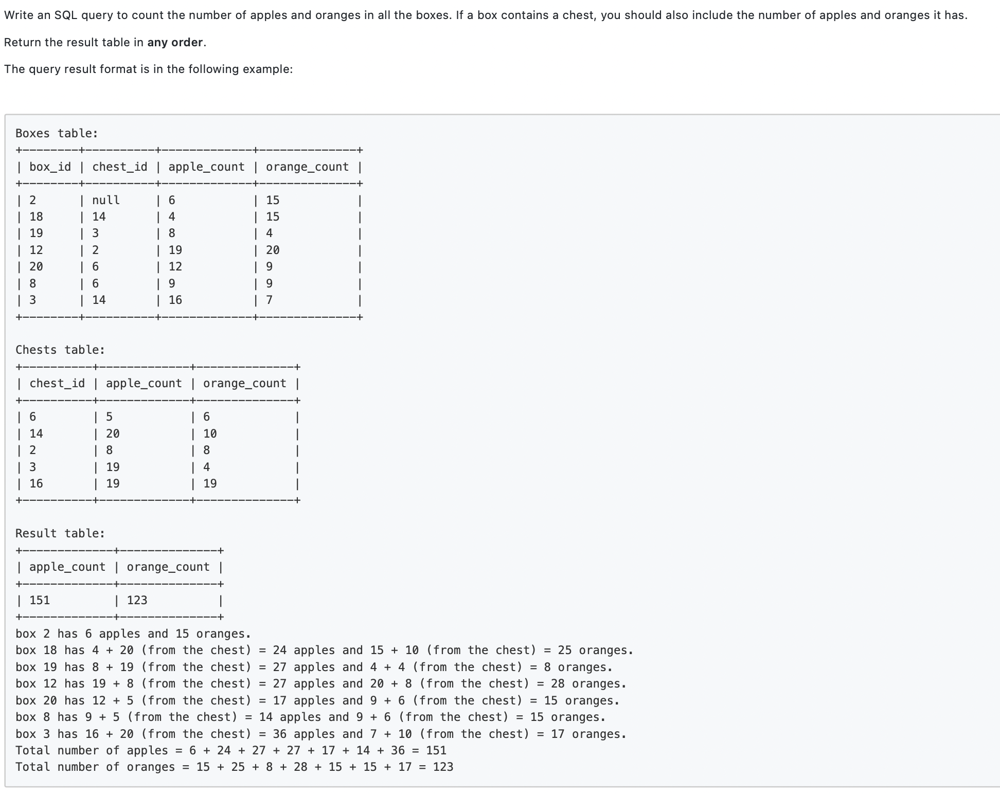

In [27]:

cursor.execute("CREATE TABLE IF NOT EXISTS Boxes (box_id int, chest_id int, apple_count int, orange_count int)") 
cursor.execute("INSERT INTO Boxes (box_id, chest_id, apple_count, orange_count) VALUES (2,null,6,15),(18,14,4,15),(19,3,8,4),(12,2,19,20),(20,6,12,9),(8,6,9,9),(3,14,16,7)")
cnx.commit()

In [28]:
cursor.execute("CREATE TABLE IF NOT EXISTS Chests (chest_id int, apple_count int, orange_count int)") 
cursor.execute("INSERT INTO Chests (chest_id, apple_count, orange_count) VALUES (6,5,6),(14,20,10),(2,8,8),(3,19,4),(16,19,19)")
cnx.commit()

In [29]:
query = '''SELECT sum(total_apple) as apple_count, sum(total_orange) as orange_count FROM 
(SELECT b.apple_count+ COALESCE(c.apple_count,0) total_apple, 
b.orange_count+COALESCE(c.orange_count,0) total_orange
FROM Boxes b LEFT JOIN Chests c ON b.chest_id=c.chest_id)'''
cursor.execute(query)
for row in cursor:
    print(row)

(151, 123)


# 1783. Grand Slam Titles
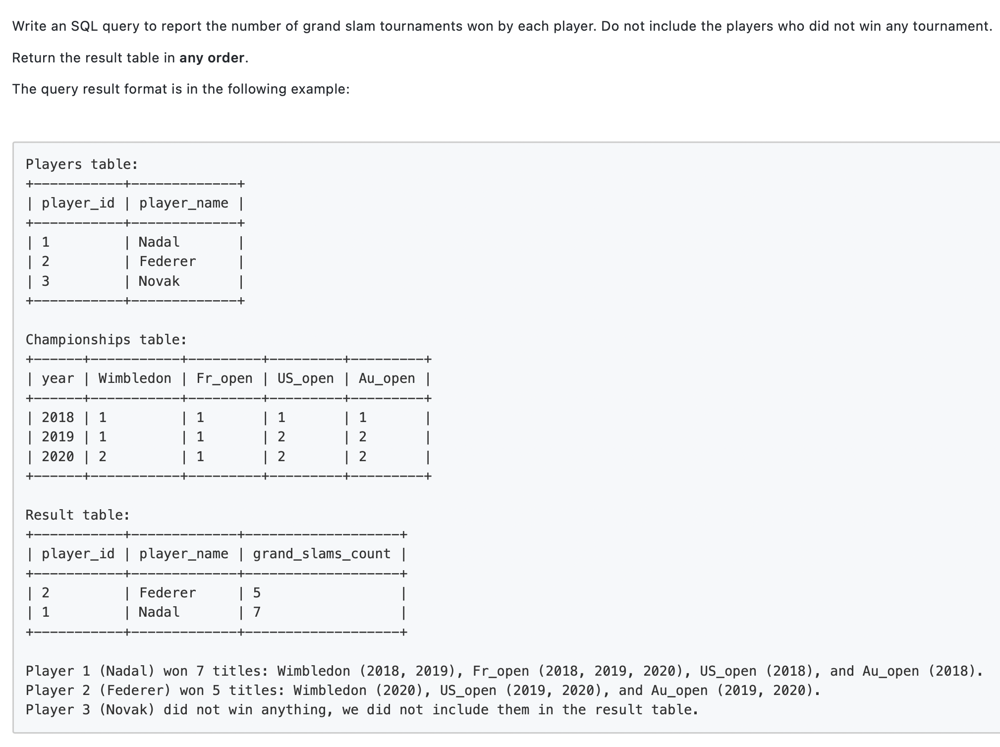

In [13]:
query = '''SELECT player_id, player_name, count() as grand_slams_count 
FROM Players JOIN 
(select Wimbledon as id from Championships 
union all
select Fr_open as id from Championships 
union all
select US_open as id from Championships 
union all
select Au_open as id from Championships)
ON player_id = id
GROUP BY id
'''
cursor.execute(query)
for row in cursor:
    print(row)

(1, 'Nadal', 7)
(2, 'Federer', 5)


# 1501. Countries You Can Safely Invest In
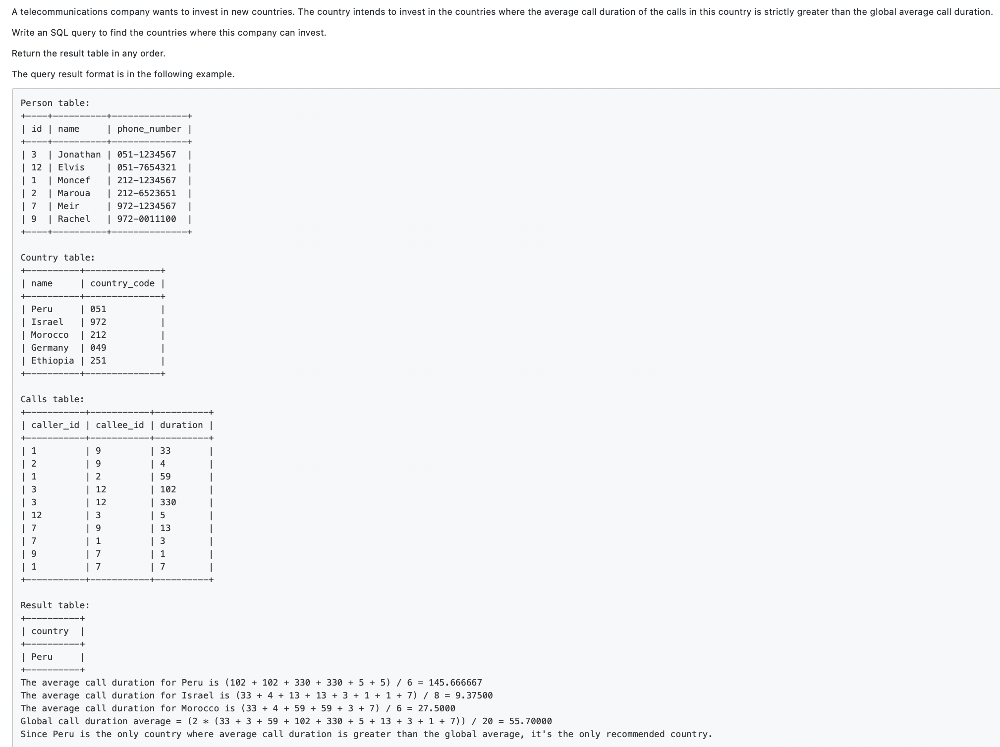

In [15]:
query = '''
SELECT Country.name FROM Person3 p JOIN Calls c
ON p.id = c.caller_id or p.id = c.callee_id
JOIN Country
ON SUBSTR(p.phone_number,1,3) = Country.country_code
GROUP BY Country.name
HAVING avg(duration) > (SELECT avg(duration) FROM Calls)
'''
cursor.execute(query)
for row in cursor:
    print(row)

('Peru',)
